In [ ]:
!apt-get install -y swig

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
swig is already the newest version (4.0.2-1ubuntu1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


In [ ]:
!pip3 install box2d-py

In [ ]:
!pip3 install gym[Box_2d]

In [ ]:
import gym

In [ ]:
!pip3 install ale-py

Episódio finalizado depois de 630 timesteps


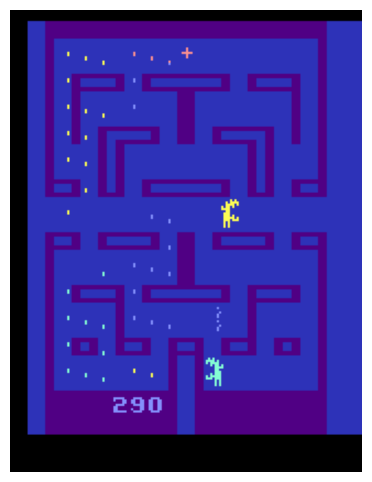

In [ ]:
import time
import numpy as np
import matplotlib.pyplot as plt
import gymnasium as gym # Usaremos 'gymnasium' em vez de 'gym'
import gymnasium.envs.registration # Import this to register ALE environments
import ale_py # Explicitly import ale_py

# Importar a classe de animação do matplotlib
from matplotlib import animation

# Instalar 'pygame' para a renderização, se necessário
# !pip install 'pygame==2.1.0'

# A lista irá salvar todas as visualizações renderizadas
lista_visualizacoes = []

# Usamos 'gymnasium' para versões mais recentes do CartPole
env = gym.make('ALE/Alien-v5', render_mode='rgb_array')

# Reinicia o ambiente e obtém o estado inicial
obs, info = env.reset()

# Loop para rodar o jogo e coletar as visualizações
for i in range(10000000000):
    # Renderiza o ambiente atual e salva o array RGB
    lista_visualizacoes.append(env.render())

    # Gera uma nova ação aleatória
    acao = env.action_space.sample()

    # Aplica a ação e obtém o próximo estado, recompensa, etc.
    obs, recompensa, terminou, truncou, info = env.step(acao)

    # Se o episódio terminou (por queda da barra ou limite de tempo)
    if terminou or truncou:
        print(f"Episódio finalizado depois de {i+1} timesteps")
        break

env.close()

# --- Parte principal para a animação ---

# Configura a figura e o eixo para a animação
fig, ax = plt.subplots(figsize=(8, 6))

# A animação precisa de uma imagem inicial.
# A função 'imshow' do Matplotlib exibe o array RGB como uma imagem.
img = ax.imshow(lista_visualizacoes[0])
ax.axis('off') # Desativa os eixos para uma visualização mais limpa

# Função de atualização que será chamada em cada frame
def animate_func(frame):
    img.set_array(lista_visualizacoes[frame])
    return [img]

# Cria a animação usando 'FuncAnimation'
ani = animation.FuncAnimation(
    fig,
    animate_func,
    frames=len(lista_visualizacoes),
    interval=50,  # Intervalo entre os frames em milissegundos
    blit=True
)

# Exibe a animação no notebook
from IPython.display import HTML
HTML(ani.to_jshtml())

In [ ]:
!pip install stable-baselines3[extra]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 93.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 67.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 32.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 75.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
import time
import numpy as np
import matplotlib.pyplot as plt
import gymnasium as gym
import gymnasium.envs.registration
import ale_py

# Importar as bibliotecas necessárias para o Stable Baselines3
from stable_baselines3 import DQN
from stable_baselines3.common.policies import MlpPolicy
from matplotlib import animation
from IPython.display import HTML

# Primeiro, instale as bibliotecas se ainda não tiver:
# !pip install 'stable-baselines3[extra]'
# !pip install 'ale-py'
# !pip install 'gymnasium'
# !pip install 'pygame==2.1.0'

# A lista irá salvar todas as visualizações renderizadas
lista_visualizacoes = []

# Usamos 'gymnasium' para versões mais recentes do CartPole
env = gym.make('ALE/Alien-v5', render_mode='rgb_array')

# --- Adicionando o modelo DQN e o treinamento ---
# O modelo DQN será criado com base no ambiente 'env'
# A MlpPolicy é uma política baseada em uma rede neural do tipo MLP (Multi-Layer Perceptron)
# É importante entender que, para ambientes como o Alien-v5, que usam imagens,
# geralmente é recomendável usar uma política baseada em CNN (Convolutional Neural Network)
# em vez de MlpPolicy. Para este exemplo, usaremos MlpPolicy, mas para um projeto real
# você precisaria adaptar a política para uma CnnPolicy.

modelo = DQN(policy='MlpPolicy', env=env, gamma=0.99, learning_rate=0.0005, buffer_size=5000,
             exploration_fraction=0.1, exploration_final_eps=0.1, exploration_initial_eps=1.0,
             batch_size=32, double_q=False, learning_starts=5000, verbose=1)

# Treinamento do modelo por 30000 timesteps
# O log_interval irá imprimir o progresso a cada 20 timesteps
modelo.learn(total_timesteps=30000, log_interval=20)

# Após o treinamento, o modelo está pronto para ser usado
print("Treinamento do modelo DQN finalizado.")

# Reinicia o ambiente e obtém o estado inicial para a visualização
obs, info = env.reset()

# Loop para rodar o jogo e coletar as visualizações usando o modelo treinado
for i in range(100000):
    # O modelo faz a previsão da melhor ação com base no estado atual
    acao, _ = modelo.predict(obs)

    # Renderiza o ambiente atual e salva o array RGB
    lista_visualizacoes.append(env.render())

    # Aplica a ação e obtém o próximo estado, recompensa, etc.
    obs, recompensa, terminou, truncou, info = env.step(acao)

    # Se o episódio terminou (por queda da barra ou limite de tempo)
    if terminou or truncou:
        print(f"Episódio finalizado depois de {i+1} timesteps")
        break

env.close()

# --- Parte principal para a animação ---

# Configura a figura e o eixo para a animação
fig, ax = plt.subplots(figsize=(8, 6))

# A animação precisa de uma imagem inicial.
# A função 'imshow' do Matplotlib exibe o array RGB como uma imagem.
img = ax.imshow(lista_visualizacoes[0])
ax.axis('off')  # Desativa os eixos para uma visualização mais limpa

# Função de atualização que será chamada em cada frame
def animate_func(frame):
    img.set_array(lista_visualizacoes[frame])
    return [img]

# Cria a animação usando 'FuncAnimation'
ani = animation.FuncAnimation(
    fig,
    animate_func,
    frames=len(lista_visualizacoes),
    interval=50,  # Intervalo entre os frames em milissegundos
    blit=True
)

# Exibe a animação no notebook
HTML(ani.to_jshtml())

/usr/local/lib/python3.11/dist-packages/numpy/_core/_dtype.py:106: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if dtype.type == np.bool:


RecursionError: maximum recursion depth exceeded while calling a Python object